In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from astropy.io import fits
from astropy.visualization import ZScaleInterval, ImageNormalize
from skimage.registration import *
from scipy.ndimage import interpolation as interp


In [55]:
# Define the directory where the data is stored
data_dir = '../data/2024-04-15/'

# Interpolate over the list of files in the data directory to get only the light frame data
light_frame_data = []
light_frame_exptimes = []
light_frame_filters = []

for file in os.listdir(data_dir):
    
    # Find if the frame type is Light and the object name of the object is consistent
    if fits.getheader(os.path.join(data_dir, file))['FRAME'] == 'Light' and \
    fits.getheader(os.path.join(data_dir, file))['OBJECT'] == 'RRGEMINORUM':
        
        # Store the image data in the pre-define lists
        light_frame_data.append(fits.getdata(os.path.join(data_dir, file)))
        light_frame_exptimes.append(fits.getheader(os.path.join(data_dir, file))['EXPTIME'])
        light_frame_filters.append(fits.getheader(os.path.join(data_dir, file))['FILTER'])

print(f"There are {len(light_frame_data)} light frames")
print(f"Exposure Times (s): {np.unique(np.array(light_frame_exptimes))}")
print(f"Filters: {np.unique(np.array(light_frame_filters))}")

There are 91 light frames
Exposure Times (s): [100.]
Filters: ['G']


In [70]:
# Do a sudo image reduction
def get_master_frame(data_dir, frame_type, frame_filter=None, frame_exptime=None):
    
    # Interpolate over the frames in the data directory:    
    if frame_type == 'Dark':
        # Get the dark frames out
        frames_data = [fits.getdata(os.path.join(data_dir, file)) \
                       for file in os.listdir(data_dir) \
                       if fits.getheader(os.path.join(data_dir, file))['FRAME'] == frame_type \
                       and fits.getheader(os.path.join(data_dir, file))['EXPTIME'] == frame_exptime]

    elif frame_type == 'Flat':
        # Get the flat frames out
        frames_data = [fits.getdata(os.path.join(data_dir, file)) \
                       for file in os.listdir(data_dir) \
                       if fits.getheader(os.path.join(data_dir, file))['FRAME'] == frame_type \
                       and fits.getheader(os.path.join(data_dir, file))['FILTER'] == frame_filter]

    # Median combine the frames
    master_frame = np.median(np.array(frames_data), axis=0)
        
    return master_frame

# Get the master dark and flat for the light frames exposure time and filter
master_dark = get_master_frame(data_dir, 'Dark', frame_filter=None, frame_exptime=100)
master_flat = get_master_frame(data_dir, 'Flat', frame_filter='G', frame_exptime=None)

# Reduce the data
reduced_light_frame_data = [(data - master_dark) / (master_flat/np.median(master_flat)) \
                            for data in light_frame_data]

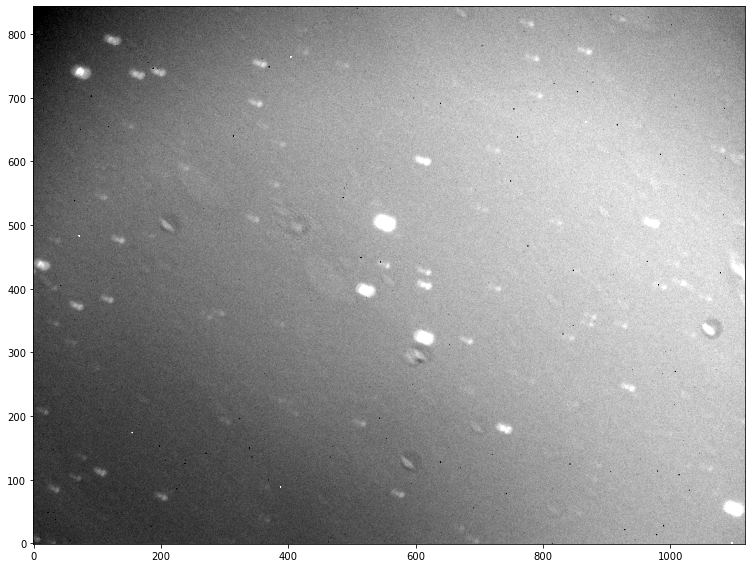

In [71]:
# Create the master light frame before aligning the frames
median_data = np.median(np.array(reduced_light_frame_data), axis=0)

# Normalize the master light frame to zscale
median_norm = ImageNormalize(median_data, interval=ZScaleInterval())

fig, ax = plt.subplots(1, 1, figsize=(12,8), tight_layout=True)

ax.imshow(median_data, origin='lower', cmap='gray', norm=median_norm)

#plt.axis('off')

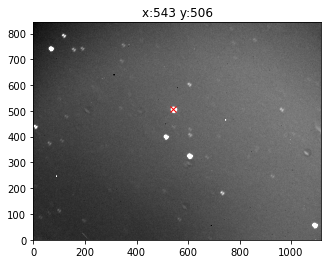

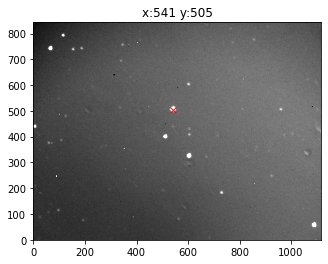

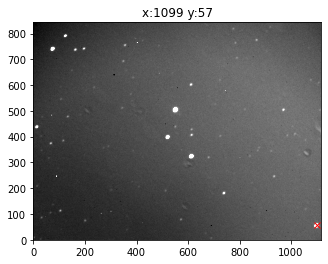

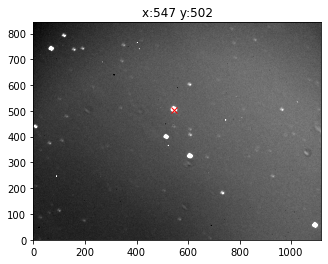

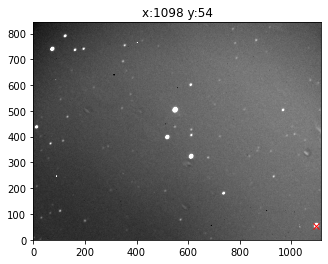

...

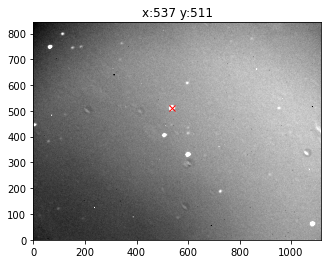

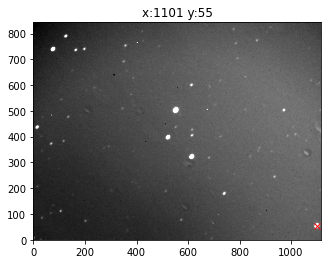

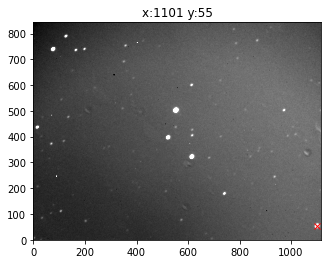

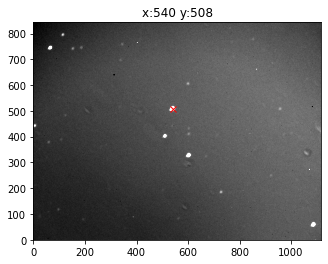

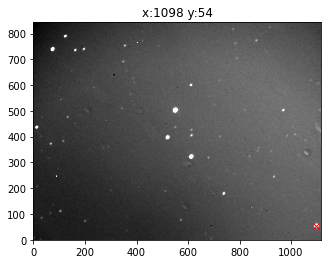

In [88]:
# Find the position of the birightest pixel in the image
for i in range(len(reduced_light_frame_data)):
    
    # Clip the image
    clipped_image = reduced_light_frame_data[i]#[300:600,400:800]
    
    # Find the x,y pixel position of the brightest pixel
    ypix, xpix = np.unravel_index(clipped_image.argmax(), clipped_image.shape)
    
    # Normalize the image to ZScale
    zscaled_clipped_image = ImageNormalize(clipped_image, interval=ZScaleInterval())
    
    # Plot the image and the postion of it's brightest pixel position
    plt.imshow(clipped_image, origin='lower', cmap='gray', norm=zscaled_clipped_image)
    plt.plot(xpix, ypix, 'rx')
    
    plt.title(f"x:{xpix} y:{ypix}")
    
    plt.show()

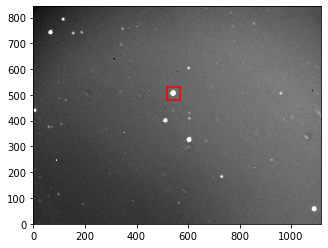

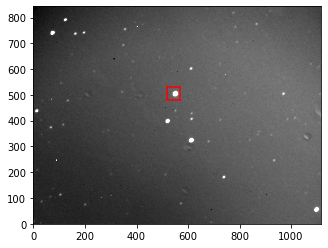

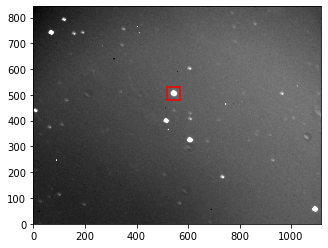

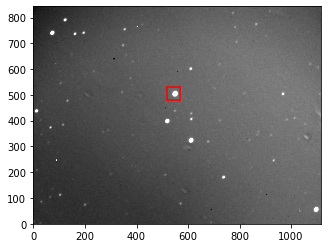

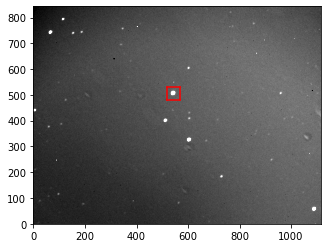

...

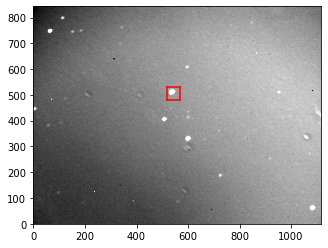

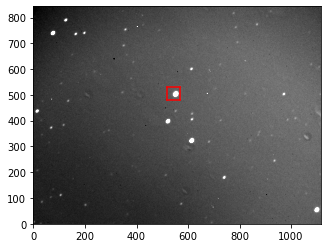

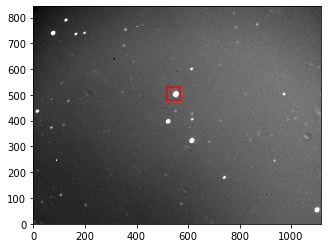

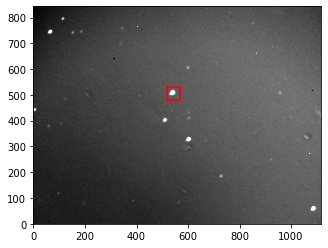

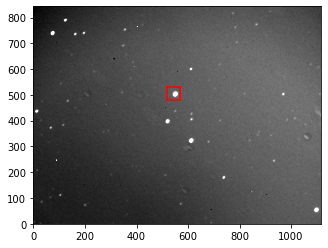

In [87]:
# Define the list to save the aligned images
aligned_images = []

# Interpolate over the light frame data to align it
for i in range(len(reduced_light_frame_data)):
    
    # Define the source image for alignment
    source_image = reduced_light_frame_data[0]
    aligned_images.append(source_image)
    
    # Find the position of the maximum pixel position
    ypix, xpix = np.unravel_index(source_image.argmax(), source_image.shape)
    
    # Clip the source image based on the x,y brightest pixels
    clipped_source_image = source_image[ypix - 25:ypix + 25, xpix - 25:xpix + 25]
    
    # If the image idx is > 0, then align those images
    if i > 0:
        # Clip the rest of the images
        clipped_data = reduced_light_frame_data[i][ypix - 25:ypix + 25, xpix - 25:xpix + 25]
        
        plt.imshow(reduced_light_frame_data[i], origin='lower', cmap='gray', norm=ImageNormalize(reduced_light_frame_data[i], interval=ZScaleInterval()))
        plt.plot([xpix - 25, xpix + 25], [ypix - 25, ypix - 25], 'r-')
        plt.plot([xpix - 25, xpix + 25], [ypix + 25, ypix + 25], 'r-')
        plt.plot([xpix - 25, xpix - 25], [ypix - 25, ypix + 25], 'r-')
        plt.plot([xpix + 25, xpix + 25], [ypix - 25, ypix + 25], 'r-')
        plt.show()
        
        # Calculate the shift of the images
        shift_vals, error, diffphase = phase_cross_correlation(clipped_source_image, clipped_data)
        
        # Align the images
        aligned_image = interp.shift(reduced_light_frame_data[i], shift_vals)
        aligned_images.append(aligned_image)


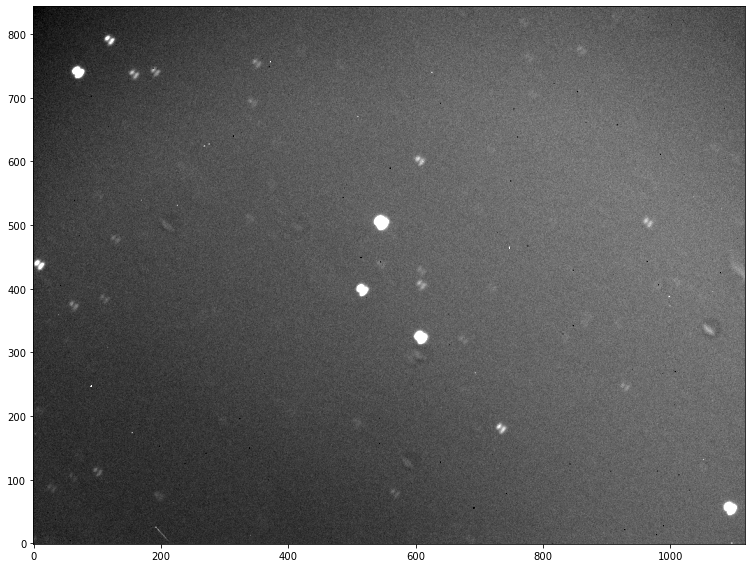

In [79]:
# Median combine the aligned data
aligned_median_data = np.median(np.array(aligned_images), axis=0)

# Normalize the master light frame to zscale
aligned_median_norm = ImageNormalize(aligned_median_data, interval=ZScaleInterval())

fig, ax = plt.subplots(1, 1, figsize=(12,8), tight_layout=True)

ax.imshow(aligned_median_data, origin='lower', cmap='gray', norm=aligned_median_norm)

#plt.axis('off')